### Setup & Feature Matching

Imports

In [1]:
import cv2
import numpy as np
import os

!pip install open3d
import open3d as o3d

!pip install pillow pillow-heif tqdm
from PIL import Image
import pillow_heif
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.4 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 39.4 MB/s eta 0:00:00


In [2]:
#mounting drive to access images

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Reading and Displaying Images

In [ ]:
jpg_images = "/content/drive/MyDrive/CV_brikwallkhoka"

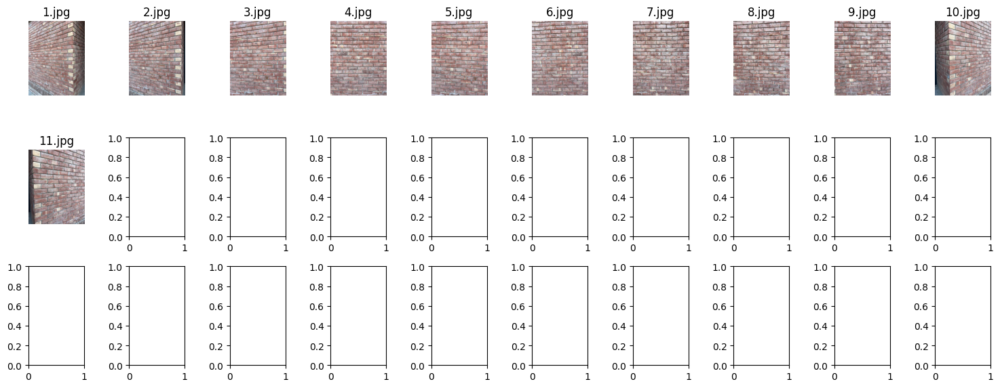

In [4]:
#displaying the images (29 in total)

fig, axes = plt.subplots(3, 10, figsize=(15, 6))
axes = axes.flatten()

for i in range(1, 12):
  img_path = os.path.join(jpg_images, f"{i}.jpg")
  if os.path.exists(img_path):
    img = mpimg.imread(img_path)
    ax = axes[i-1]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"{i}.jpg")

plt.tight_layout()
plt.show()

Preprocessing

In [5]:
preprocessed = []

for i in range(1, 12):
    img_path = os.path.join(jpg_images, f"{i}.jpg")
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        #converting to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        preprocessed.append(gray)

ORB initiation

In [6]:
orb = cv2.ORB_create(nfeatures=2000)

Running ORB model on first 5 images

In [7]:
#retrieving keypoints and descriptors from the images
keypoints = []
descriptors = []

for gray in preprocessed:
    kp, des = orb.detectAndCompute(gray, None)
    keypoints.append(kp)
    descriptors.append(des)

#using lowe's ratio test to filter best matches between consecutive image pairs

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
good_matches_list = []

for i in range(10):
    des1 = descriptors[i]
    des2 = descriptors[i + 1]

    #KNN match
    matches = bf.knnMatch(des1, des2, k=2)

    #applying lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    good_matches_list.append(good_matches)

#displaying first five
for i in range(5):
    print(f"Image {i} and Image {i+1}: {len(good_matches_list[i])} good matches")

Image 0 and Image 1: 451 good matches
Image 1 and Image 2: 480 good matches
Image 2 and Image 3: 120 good matches
Image 3 and Image 4: 226 good matches
Image 4 and Image 5: 40 good matches


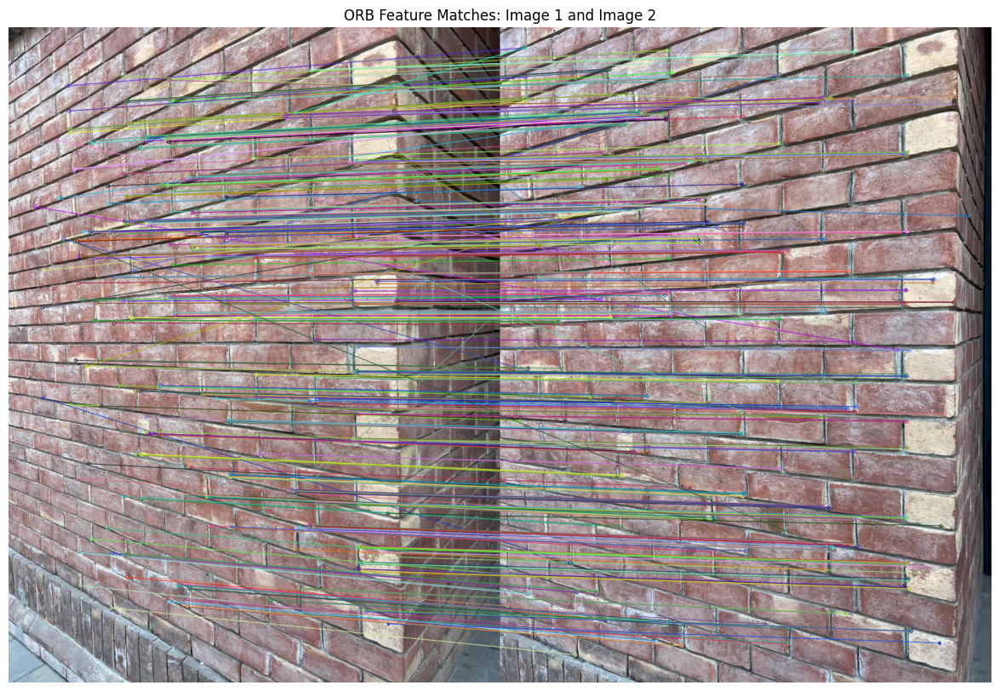

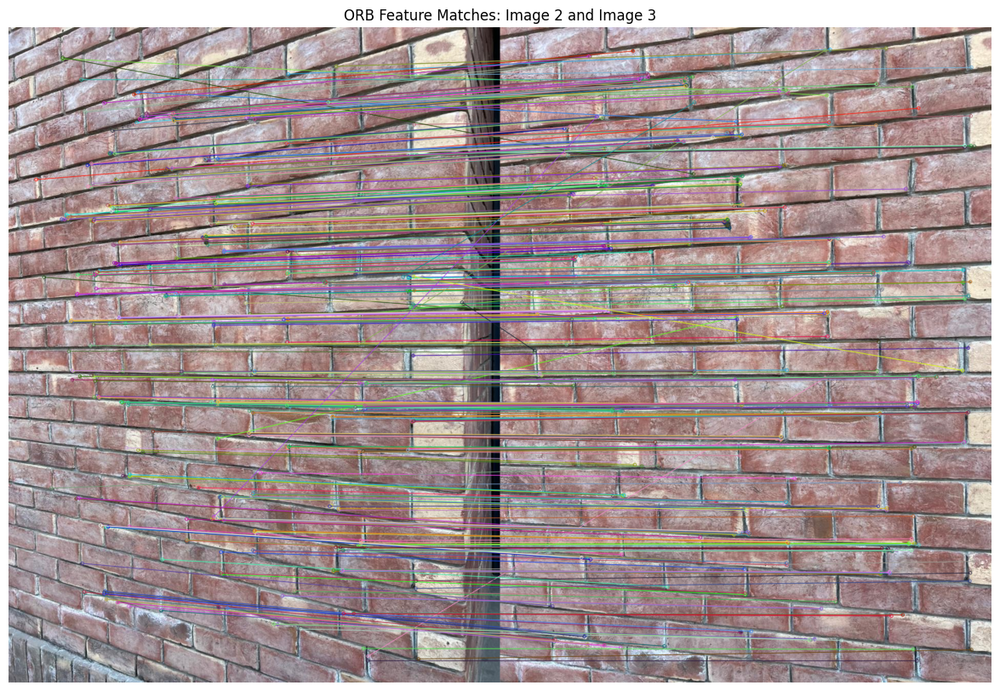

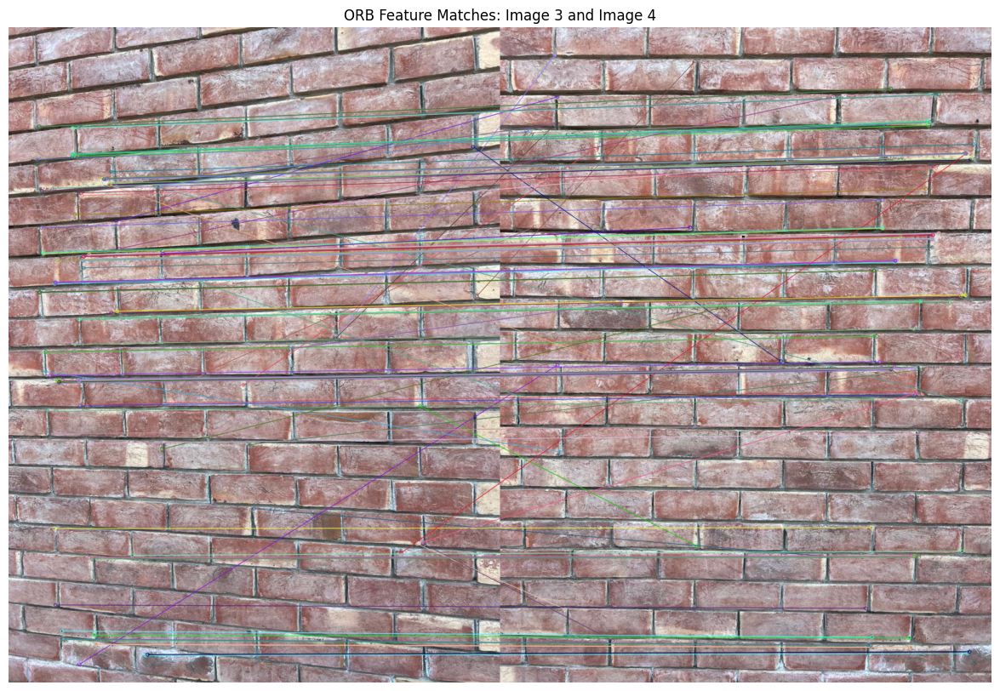

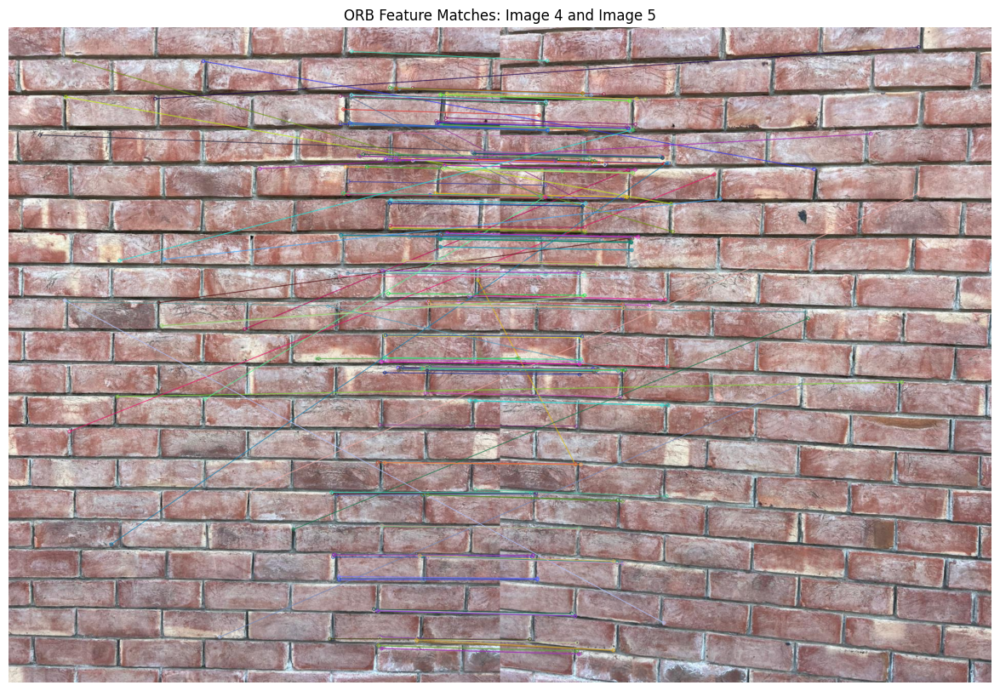

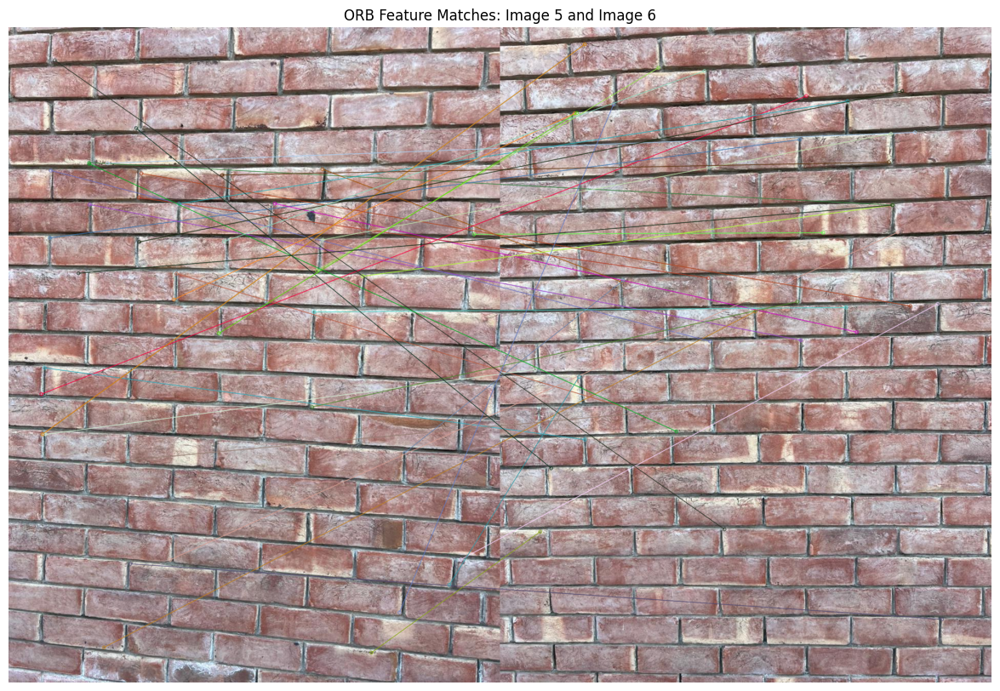

In [8]:
#visualization of the feature matching

for i, good_matches in enumerate(good_matches_list[:5]):
  img1 = cv2.imread(os.path.join(jpg_images, f"{i+1}.jpg"), cv2.IMREAD_COLOR) #because na
  img2 = cv2.imread(os.path.join(jpg_images, f"{i+2}.jpg"), cv2.IMREAD_COLOR)
  kp1 = keypoints[i]
  kp2 = keypoints[i+1]

  #draw the good matches
  img_matches = cv2.drawMatches(
      img1, kp1,
      img2, kp2,
      good_matches, None,
      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
  )

  plt.figure(figsize=(20, 10))
  plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
  plt.title(f'ORB Feature Matches: Image {i+1} and Image {i+2}')
  plt.axis('off')
  plt.show()

### Two-View Reconstruction

Essential Matrix Estimation

In [9]:
#converting orb keypoints to arrays
all_pts1 = []
all_pts2 = []

for i in range(10): #go through each pair from 1-2 to 28-29
    kp1 = keypoints[i]
    kp2 = keypoints[i + 1]
    good_matches = good_matches_list[i]

    #convert keypoints to float32 coordinate arrays
    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

    all_pts1.append(pts1)
    all_pts2.append(pts2)

#estimate the Essential Matrix, E, by passing your matched points and the intrinsic matrix K to the 'cv2.findEssentialMat' function with RANSAC.
!pip install exifread
import exifread

#finding intrinsic matrix K
#since K is gonna be the same for any picture from the same camera just use the first picture
img_path = os.path.join(jpg_images, "1.jpg")

#read exif
with open(img_path, 'rb') as f:
    tags = exifread.process_file(f)

#focal length in mm
if "EXIF FocalLength" in tags:
    f_mm = float(tags["EXIF FocalLength"].values[0].num) / float(tags["EXIF FocalLength"].values[0].den)
else:
    f_mm = 4.0

#image resolution
img = Image.open(img_path)
w, h = img.size

#assume sensor width
sensor_width_mm = 6.17  #assumed for a phone camera

#convert focal length to pixels
f_px = f_mm / sensor_width_mm * w

#principal point = center of image
cx, cy = w / 2, h / 2

K = np.array([[f_px, 0, cx],
              [0, f_px, cy],
              [0,     0,   1]])

#now finding the essential matrices for all pairs
essential_matrices = []
masks = []

for i in range(10): #theres 28 pairs
    pts1 = all_pts1[i]
    pts2 = all_pts2[i]

    #compute Essential Matrix with RANSAC
    E, mask = cv2.findEssentialMat(
        pts1,
        pts2,
        K,
        method=cv2.RANSAC,
        prob=0.999,
        threshold=1.0
    )

    essential_matrices.append(E)
    masks.append(mask)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 1.8 MB/s eta 0:00:00


Recovering Rotations R and Translations t

In [10]:
rotations = []
translations = []

for i in range(10):
    pts1 = all_pts1[i]
    pts2 = all_pts2[i]

    #extract RANSAC inliers
    pts1_in = pts1[masks[i].ravel() == 1]
    pts2_in = pts2[masks[i].ravel() == 1]

    #recover relative pose (R, t)
    _, R, t, mask_pose = cv2.recoverPose(E, pts1_in, pts2_in, K)

    rotations.append(R)
    translations.append(t)


Cheirality Check and Point Cloud

Best pose has 364/364 points in front of both cameras


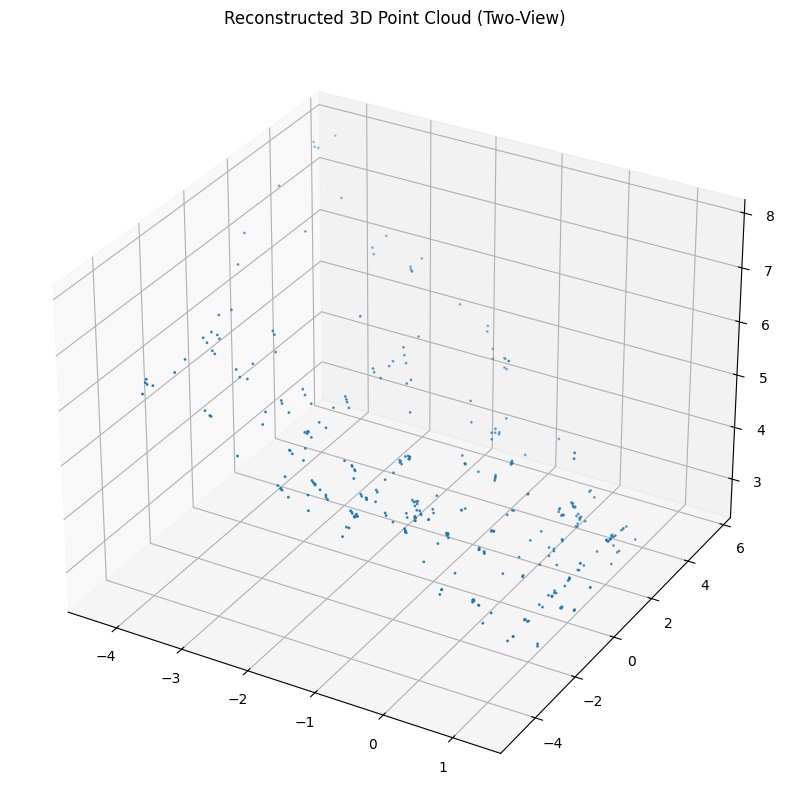

In [11]:
pts1 = all_pts1[0]
pts2 = all_pts2[0]

#extract RANSAC inliers
pts1_in = pts1[masks[0].ravel() == 1]
pts2_in = pts2[masks[0].ravel() == 1]

E = essential_matrices[0]

#decompose Essential Matrix into 4 possible [R|t] solutions
R1, R2, t = cv2.decomposeEssentialMat(E)
t = t.reshape(3, 1)

#four possible poses
pose_candidates = [
    (R1, t),
    (R1, -t),
    (R2, t),
    (R2, -t)
]

#projection matrix for camera 1 (identity)
P1 = K @ np.hstack((np.eye(3), np.zeros((3,1))))

best_pose = None
max_good_points = 0
best_pts3D = None

#test each pose with cheirality check
for R, t in pose_candidates:
    P2 = K @ np.hstack((R, t))

    pts4D_h = cv2.triangulatePoints(P1, P2, pts1_in.T, pts2_in.T)
    pts3D = (pts4D_h[:3] / pts4D_h[3]).T

    #cheirality check (count points in front of both cameras)
    good_count = 0
    for j in range(len(pts3D)):
        #Check if point is in front of camera 1 (Z > 0)
        if pts3D[j, 2] > 0:
            #Transform point to camera 2 frame and check Z > 0
            pt_cam2 = R @ pts3D[j] + t.ravel()
            if pt_cam2[2] > 0:
                good_count += 1

    if good_count > max_good_points:
        max_good_points = good_count
        best_pose = (R, t)
        best_pts3D = pts3D

R, t = best_pose
print(f"Best pose has {max_good_points}/{len(best_pts3D)} points in front of both cameras")

#filter to keep only valid points
pts3D_filtered = []
for j in range(len(best_pts3D)):
    if best_pts3D[j, 2] > 0:
        pt_cam2 = R @ best_pts3D[j] + t.ravel()
        if pt_cam2[2] > 0:
            pts3D_filtered.append(best_pts3D[j])

pts3D_filtered = np.array(pts3D_filtered)

#save to PLY file
with open('point_cloud.ply', 'w') as f:
    f.write('ply\n')
    f.write('format ascii 1.0\n')
    f.write(f'element vertex {len(pts3D_filtered)}\n')
    f.write('property float x\n')
    f.write('property float y\n')
    f.write('property float z\n')
    f.write('end_header\n')
    for pt in pts3D_filtered:
        f.write(f'{pt[0]} {pt[1]} {pt[2]}\n')

#visualize
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pts3D_filtered[:, 0], pts3D_filtered[:, 1], pts3D_filtered[:, 2], s=1)
ax.set_title("Reconstructed 3D Point Cloud (Two-View)")
plt.show()

2D scatterplot of 3d points

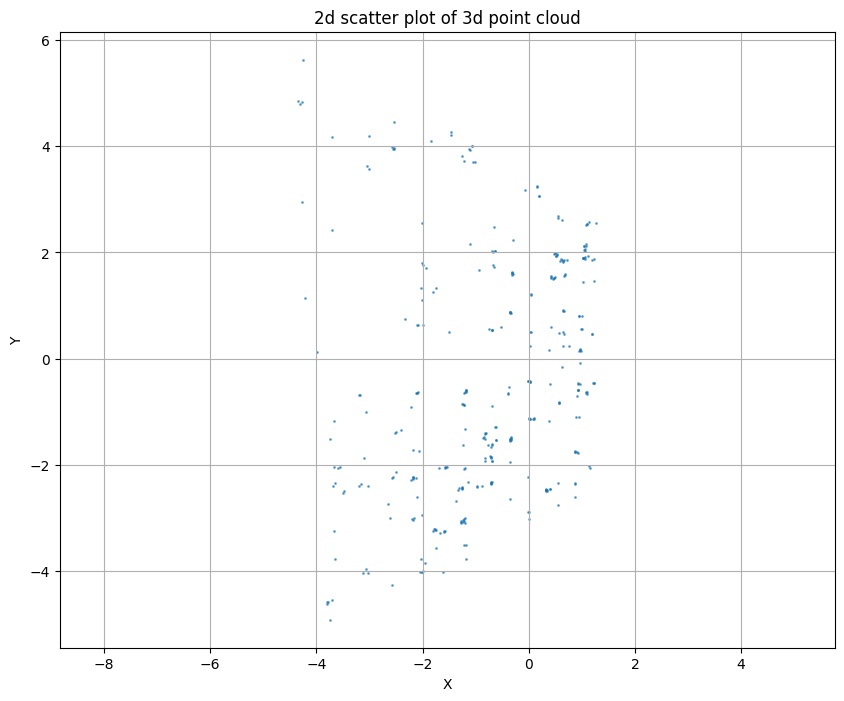

In [15]:
#ignoring z axis and just focusing on the xy plane

plt.figure(figsize=(10, 8))
plt.scatter(pts3D_filtered[:, 0], pts3D_filtered[:, 1], s=1, alpha=0.6)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('2d scatter plot of 3d point cloud')
plt.axis('equal')
plt.grid(True)
plt.show()

Incremental SFM


FINDING BEST INITIAL PAIR
✓ Using pair 9-10 with 400 inliers

Initializing from pair 9-10...
  Triangulated 400 points
  Camera 9: 400 tracked
  Camera 10: 373 tracked

Initialized: 400 points, cameras 9 and 10

INCREMENTAL RECONSTRUCTION
Forward: []
Backward: [8, 7, 6, 5, 4, 3, 2, 1, 0]

--- Adding Camera 8 ---
  Adjacent camera: 9 (backward)
  Found 36 2D-3D correspondences
  ✓ Success: 15 inliers, 15 tracked
  Triangulated 49 new points

--- Adding Camera 7 ---
  Adjacent camera: 8 (backward)
  Found 12 2D-3D correspondences
  ✓ Success: 6 inliers, 6 tracked
  Triangulated 437 new points

--- Adding Camera 6 ---
  Adjacent camera: 7 (backward)
  Found 14 2D-3D correspondences
  ⚠️  PnP failed (inliers: 5)

--- Adding Camera 5 ---
  ⚠️  No adjacent camera registered!

--- Adding Camera 4 ---
  ⚠️  No adjacent camera registered!

--- Adding Camera 3 ---
  ⚠️  No adjacent camera registered!

--- Adding Camera 2 ---
  ⚠️  No adjacent camera registered!

--- Adding Camera 1 ---
  ⚠️  No

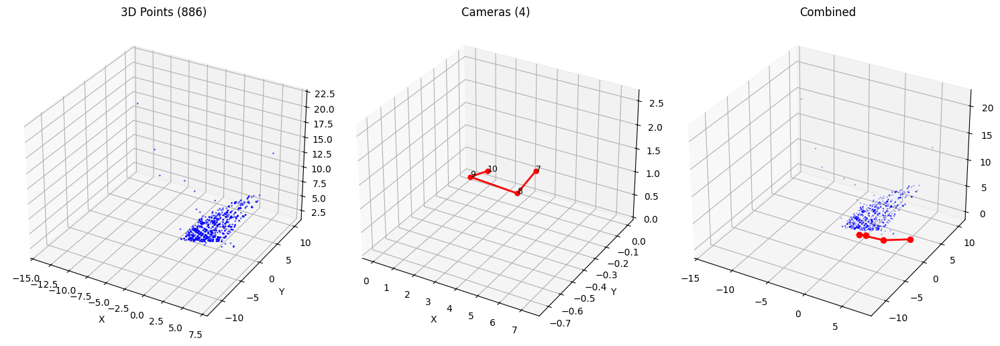

In [ ]:
from collections import defaultdict

#finding best initial pair

print("\n" + "="*60)
print("FINDING BEST INITIAL PAIR")
print("="*60)

best_pair_idx = 0
max_inliers = np.sum(masks[0].ravel() == 1)

for i in range(len(masks)):
    num_inliers = np.sum(masks[i].ravel() == 1)
    if num_inliers > max_inliers:
        max_inliers = num_inliers
        best_pair_idx = i

print(f"✓ Using pair {best_pair_idx}-{best_pair_idx+1} with {max_inliers} inliers")

#use best pair for initialization

def initialize_two_view(pair_idx):

    pts1 = all_pts1[pair_idx]
    pts2 = all_pts2[pair_idx]
    E = essential_matrices[pair_idx]
    mask = masks[pair_idx]

    mask_essential = mask.ravel() == 1
    pts1_in = pts1[mask_essential]
    pts2_in = pts2[mask_essential]

    R1, R2, t = cv2.decomposeEssentialMat(E)
    t = t.reshape(3, 1)
    pose_candidates = [(R1, t), (R1, -t), (R2, t), (R2, -t)]

    P1 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))

    best_pose = None
    max_good_points = 0
    best_pts3D = None
    best_mask = None

    for R, t in pose_candidates:
        P2 = K @ np.hstack((R, t))
        pts4D_h = cv2.triangulatePoints(P1, P2, pts1_in.T, pts2_in.T)
        pts3D = (pts4D_h[:3] / pts4D_h[3]).T

        z1 = pts3D[:, 2]
        z2 = (R @ pts3D.T + t).T[:, 2]
        mask_cheirality = (z1 > 0) & (z2 > 0) & (z1 < 50) & (z2 < 50)
        good_count = np.sum(mask_cheirality)

        if good_count > max_good_points:
            max_good_points = good_count
            best_pose = (R, t)
            best_pts3D = pts3D
            best_mask = mask_cheirality

    R, t = best_pose
    pts3D_filtered = best_pts3D[best_mask]

    # Build keypoint tracking
    essential_inlier_indices = np.where(mask_essential)[0]
    cheirality_inlier_indices = essential_inlier_indices[best_mask]

    keypoint_to_3d = defaultdict(dict)

    for i, match_idx in enumerate(cheirality_inlier_indices):
        match = good_matches_list[pair_idx][match_idx]
        kp1_idx = match.queryIdx
        kp2_idx = match.trainIdx

        keypoint_to_3d[pair_idx][kp1_idx] = i
        keypoint_to_3d[pair_idx + 1][kp2_idx] = i

    print(f"  Triangulated {len(pts3D_filtered)} points")
    print(f"  Camera {pair_idx}: {len(keypoint_to_3d[pair_idx])} tracked")
    print(f"  Camera {pair_idx + 1}: {len(keypoint_to_3d[pair_idx + 1])} tracked")

    return R, t, pts3D_filtered, keypoint_to_3d

R_init, t_init, pts3D_init, keypoint_to_3d = initialize_two_view(best_pair_idx)

#initializing global state

camera_poses = {
    best_pair_idx: (np.eye(3), np.zeros((3, 1))),
    best_pair_idx + 1: (R_init, t_init)
}

points_3d = list(pts3D_init)
point_observations = [[(best_pair_idx, kp_idx), (best_pair_idx + 1, keypoint_to_3d[best_pair_idx + 1].get(kp_idx, -1))]
                      for kp_idx in keypoint_to_3d[best_pair_idx].keys()]

print(f"\nInitialized: {len(points_3d)} points, cameras {best_pair_idx} and {best_pair_idx + 1}")

#adding cameras sequentially

def add_next_camera(cam_idx):
    print(f"\n--- Adding Camera {cam_idx} ---")

    # Determine which adjacent camera is registered
    prev_cam = None
    matches = None
    forward = True

    if cam_idx - 1 in camera_poses:
        # Previous camera is registered, we're going forward
        prev_cam = cam_idx - 1
        matches = good_matches_list[prev_cam]
        forward = True
    elif cam_idx + 1 in camera_poses:
        # Next camera is registered, we're going backward
        prev_cam = cam_idx + 1
        matches = good_matches_list[cam_idx]
        forward = False
    else:
        print(f"No adjacent camera registered!")
        return False

    print(f"  Adjacent camera: {prev_cam} ({'forward' if forward else 'backward'})")

    # Get 2D-3D correspondences
    pts_2d = []
    pts_3d_indices = []

    if forward:
        # cam_idx - 1 → cam_idx
        for match in matches:
            kp_prev_idx = match.queryIdx
            kp_new_idx = match.trainIdx

            if kp_prev_idx in keypoint_to_3d[prev_cam]:
                pt3d_idx = keypoint_to_3d[prev_cam][kp_prev_idx]
                pt_2d = keypoints[cam_idx][kp_new_idx].pt
                pts_2d.append(pt_2d)
                pts_3d_indices.append((pt3d_idx, kp_new_idx))
    else:
        # cam_idx ← cam_idx + 1
        for match in matches:
            kp_new_idx = match.queryIdx
            kp_prev_idx = match.trainIdx

            if kp_prev_idx in keypoint_to_3d[prev_cam]:
                pt3d_idx = keypoint_to_3d[prev_cam][kp_prev_idx]
                pt_2d = keypoints[cam_idx][kp_new_idx].pt
                pts_2d.append(pt_2d)
                pts_3d_indices.append((pt3d_idx, kp_new_idx))

    print(f"  Found {len(pts_2d)} 2D-3D correspondences")

    if len(pts_2d) < 6:
        print(f"Not enough correspondences")
        return False

    # Prepare for PnP
    pts_2d = np.array(pts_2d, dtype=np.float32)
    pts_3d_for_pnp = np.array([points_3d[idx[0]] for idx in pts_3d_indices], dtype=np.float32)

    # Solve PnP
    success, rvec, tvec, inliers = cv2.solvePnPRansac(
        pts_3d_for_pnp, pts_2d, K, None,
        iterationsCount=2000,
        reprojectionError=4.0,
        confidence=0.999
    )

    if not success or inliers is None or len(inliers) < 6:
        print(f"PnP failed (inliers: {len(inliers) if inliers is not None else 0})")
        return False

    # Add camera
    R_new, _ = cv2.Rodrigues(rvec)
    t_new = tvec.reshape(3, 1)
    camera_poses[cam_idx] = (R_new, t_new)

    # Update tracking
    for inlier_idx in inliers.ravel():
        pt3d_idx, kp_new_idx = pts_3d_indices[inlier_idx]
        keypoint_to_3d[cam_idx][kp_new_idx] = pt3d_idx
        point_observations[pt3d_idx].append((cam_idx, kp_new_idx))

    print(f"  ✓ Success: {len(inliers)} inliers, {len(keypoint_to_3d[cam_idx])} tracked")

    # Triangulate new points with adjacent camera
    triangulate_with_camera(cam_idx, prev_cam)

    return True

def triangulate_with_camera(cam_idx, other_cam_idx):

    # Determine the match direction
    if cam_idx > other_cam_idx:
        matches = good_matches_list[other_cam_idx]
        cam1, cam2 = other_cam_idx, cam_idx
        swap = False
    else:
        matches = good_matches_list[cam_idx]
        cam1, cam2 = cam_idx, other_cam_idx
        swap = True

    R1, t1 = camera_poses[cam1]
    R2, t2 = camera_poses[cam2]

    P1 = K @ np.hstack((R1, t1))
    P2 = K @ np.hstack((R2, t2))

    new_pts_1 = []
    new_pts_2 = []
    new_match_info = []

    for match in matches:
        kp1_idx = match.queryIdx
        kp2_idx = match.trainIdx

        # Only triangulate if NEITHER keypoint has a 3D point
        if (kp1_idx not in keypoint_to_3d[cam1] and
            kp2_idx not in keypoint_to_3d[cam2]):

            pt1 = keypoints[cam1][kp1_idx].pt
            pt2 = keypoints[cam2][kp2_idx].pt

            new_pts_1.append(pt1)
            new_pts_2.append(pt2)
            new_match_info.append((kp1_idx, kp2_idx))

    if len(new_pts_1) == 0:
        return 0

    new_pts_1 = np.array(new_pts_1, dtype=np.float32).T
    new_pts_2 = np.array(new_pts_2, dtype=np.float32).T

    pts4D = cv2.triangulatePoints(P1, P2, new_pts_1, new_pts_2)
    pts3D_new = (pts4D[:3] / pts4D[3]).T

    count_added = 0
    for i, pt3d in enumerate(pts3D_new):
        z1 = (R1 @ pt3d.reshape(3, 1) + t1)[2, 0]
        z2 = (R2 @ pt3d.reshape(3, 1) + t2)[2, 0]

        if z1 > 0 and z2 > 0 and z1 < 50 and z2 < 50:
            pt3d_idx = len(points_3d)
            points_3d.append(pt3d)

            kp1_idx, kp2_idx = new_match_info[i]
            keypoint_to_3d[cam1][kp1_idx] = pt3d_idx
            keypoint_to_3d[cam2][kp2_idx] = pt3d_idx
            point_observations.append([(cam1, kp1_idx), (cam2, kp2_idx)])
            count_added += 1

    if count_added > 0:
        print(f"  Triangulated {count_added} new points")

    return count_added

#main reconstruction

print("\n" + "="*60)
print("INCREMENTAL RECONSTRUCTION")
print("="*60)

num_images = len(preprocessed)
cameras_forward = list(range(best_pair_idx + 2, num_images))
cameras_backward = list(range(best_pair_idx - 1, -1, -1))

print(f"Forward: {cameras_forward}")
print(f"Backward: {cameras_backward}")

# Forward direction
for cam_idx in cameras_forward:
    add_next_camera(cam_idx)

# Backward direction
for cam_idx in cameras_backward:
    add_next_camera(cam_idx)

print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Cameras registered: {len(camera_poses)}/{num_images}")
print(f"Total 3D points: {len(points_3d)}")
print("="*60)

#visualize

points_3d_array = np.array(points_3d)

with open('point_cloud_multiview.ply', 'w') as f:
    f.write('ply\nformat ascii 1.0\n')
    f.write(f'element vertex {len(points_3d_array)}\n')
    f.write('property float x\nproperty float y\nproperty float z\n')
    f.write('end_header\n')
    for pt in points_3d_array:
        f.write(f'{pt[0]} {pt[1]} {pt[2]}\n')

print(f"\n✓ Saved to 'point_cloud_multiview.ply'")

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 5))

# Point cloud
ax1 = fig.add_subplot(131, projection='3d')
ax1.scatter(points_3d_array[:, 0], points_3d_array[:, 1], points_3d_array[:, 2],
            s=1, c='blue', alpha=0.5)
ax1.set_title(f"3D Points ({len(points_3d_array)})")
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')

# Camera trajectory
ax2 = fig.add_subplot(132, projection='3d')
camera_positions = []
cam_labels = []
for cam_idx in sorted(camera_poses.keys()):
    R, t = camera_poses[cam_idx]
    C = -R.T @ t
    camera_positions.append(C.ravel())
    cam_labels.append(cam_idx)

camera_positions = np.array(camera_positions)
ax2.plot(camera_positions[:, 0], camera_positions[:, 1], camera_positions[:, 2],
         'r-o', markersize=5, linewidth=2)
for i, label in enumerate(cam_labels):
    pos = camera_positions[i]
    ax2.text(pos[0], pos[1], pos[2], f'{label}', fontsize=9)
ax2.set_title(f"Cameras ({len(camera_poses)})")
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')

# Combined
ax3 = fig.add_subplot(133, projection='3d')
ax3.scatter(points_3d_array[:, 0], points_3d_array[:, 1], points_3d_array[:, 2],
            s=0.5, c='blue', alpha=0.3)
ax3.plot(camera_positions[:, 0], camera_positions[:, 1], camera_positions[:, 2],
         'r-o', markersize=6, linewidth=2)
ax3.set_title("Combined")

plt.tight_layout()
plt.show()

Refinement using Bundling

In [ ]:
import numpy as np
from scipy.optimize import least_squares
from scipy.sparse import lil_matrix
import cv2

def skew_mat(v):
    """v: (...,3) -> (...,3,3) skew-symmetric matrices"""
    vx = v[..., 0]
    vy = v[..., 1]
    vz = v[..., 2]
    zero = np.zeros_like(vx)
    m = np.stack([
        zero, -vz,  vy,
         vz, zero, -vx,
        -vy,  vx, zero
    ], axis=-1)
    return m.reshape(v.shape[:-1] + (3, 3))

def rodrigues_batch(rvecs):
    """
    rvecs: (N,3) axis-angle vectors
    returns: R (N,3,3)
    """
    theta = np.linalg.norm(rvecs, axis=1)
    small = theta < 1e-8
    R = np.zeros((len(rvecs), 3, 3), dtype=float)

    # For non-small angles, use Rodrigues formula
    nonzero_idx = ~small
    if np.any(nonzero_idx):
        r_non = rvecs[nonzero_idx]
        theta_n = theta[nonzero_idx][:, None]
        k = r_non / theta_n  # unit axis
        K = skew_mat(k)      # (M,3,3)
        I = np.eye(3)[None, :, :]
        sin_t = np.sin(theta_n)[:, None]
        cos_t = np.cos(theta_n)[:, None]
        # R = I + sin(theta) * K + (1-cos(theta)) * K^2
        R_n = I + sin_t * K + (1 - cos_t) * (K @ K)
        R[nonzero_idx] = R_n

    # For very small angles, use first-order approximation: R ≈ I + K
    if np.any(small):
        idx = np.where(small)[0]
        K = skew_mat(rvecs[small])
        I = np.eye(3)[None, :, :]
        R_s = I + K
        R[small] = R_s

    return R  # (N,3,3)

def build_observation_arrays(point_observations, keypoints, cam_ids):
   
    cam_index = {cid: i for i, cid in enumerate(cam_ids)}
    obs_cam_idx = []
    obs_point_idx = []
    obs_xy = []

    for p_idx, obs in enumerate(point_observations):
        for cam_idx, kp_idx in obs:
            # skip missing kp (sometimes -1) just in case
            if kp_idx is None or kp_idx < 0:
                continue
            obs_cam_idx.append(cam_index[cam_idx])
            obs_point_idx.append(p_idx)
            obs_xy.append(keypoints[cam_idx][kp_idx].pt)

    obs_cam_idx = np.array(obs_cam_idx, dtype=np.int32)
    obs_point_idx = np.array(obs_point_idx, dtype=np.int32)
    obs_xy = np.array(obs_xy, dtype=np.float64)
    return obs_cam_idx, obs_point_idx, obs_xy

def pack_parameters(camera_poses, points_3d, cam_ids):
    cams = []
    for idx in cam_ids:
        R, t = camera_poses[idx]
        rvec, _ = cv2.Rodrigues(R)
        cams.append(np.hstack([rvec.flatten(), t.flatten()]))
    cams = np.hstack(cams)
    pts = np.hstack(points_3d).flatten()
    return np.hstack([cams, pts])

def unpack_parameters(params, num_cameras, num_points):
    camera_params = params[:num_cameras * 6].reshape((num_cameras, 6))
    point_params = params[num_cameras * 6:].reshape((num_points, 3))
    return camera_params, point_params

def residuals_vectorized(params, K, num_cameras, num_points,
                         obs_cam_idx, obs_point_idx, obs_xy):
    """
    params: vector of length 6*num_cameras + 3*num_points
    obs_*: arrays of length n_obs
    returns: residuals shape (2*n_obs,)
    """
    camera_params, point_params = unpack_parameters(params, num_cameras, num_points)
    # camera params
    rvecs = camera_params[:, :3]        # (C,3)
    tvecs = camera_params[:, 3:].reshape(num_cameras, 3)  # (C,3)

    # build rotation matrices
    Rmats = rodrigues_batch(rvecs)  # (C,3,3)

    # select per-observation camera R and t
    R_obs = Rmats[obs_cam_idx]      # (n_obs,3,3)
    t_obs = tvecs[obs_cam_idx]      # (n_obs,3)

    # select 3D points per observation
    P_obs = point_params[obs_point_idx]  # (n_obs,3)

    # transform points into camera frame: X_c = R * X + t
    Xc = np.einsum('nij,nj->ni', R_obs, P_obs) + t_obs  # (n_obs,3)

    # perspective divide + intrinsics (assumes fx=K[0,0], fy=K[1,1], cx, cy)
    X = Xc[:, 0]
    Y = Xc[:, 1]
    Z = Xc[:, 2]
    # avoid divide by zero
    Z_safe = np.where(Z == 0, 1e-8, Z)

    fx = K[0, 0]
    fy = K[1, 1]
    cx = K[0, 2]
    cy = K[1, 2]

    u = fx * (X / Z_safe) + cx
    v = fy * (Y / Z_safe) + cy

    proj = np.vstack((u, v)).T  # (n_obs,2)
    res = (proj - obs_xy).ravel()  # (2*n_obs,)
    return res

def build_jacobian_sparsity(num_cameras, num_points, obs_cam_idx, obs_point_idx):
    n_obs = len(obs_cam_idx)
    m = 2 * n_obs
    n = 6 * num_cameras + 3 * num_points
    J = lil_matrix((m, n), dtype=int)

    for i in range(n_obs):
        cam = obs_cam_idx[i]
        p = obs_point_idx[i]
        row_x = 2 * i
        row_y = 2 * i + 1
        # camera columns: 6 * cam  .. 6*cam+5
        cam_col = 6 * cam
        J[row_x, cam_col:cam_col + 6] = 1
        J[row_y, cam_col:cam_col + 6] = 1
        # point columns: 6*num_cameras + 3*p .. +2
        pt_col = 6 * num_cameras + 3 * p
        J[row_x, pt_col:pt_col + 3] = 1
        J[row_y, pt_col:pt_col + 3] = 1

    return J

def run_bundle_adjustment_fast(camera_poses, points_3d, point_observations, K,
                               max_nfev=200, verbose=2, xtol=1e-10, ftol=1e-10):
    """
    camera_poses: dict {cam_idx: (R,t)}
    points_3d: list of (x,y,z)
    point_observations: list per point of [(cam_idx,kp_idx), ...]
    K: camera intrinsic matrix
    """
    print("\n=== Running FAST Bundle Adjustment ===")
    cam_ids = sorted(camera_poses.keys())
    num_cameras = len(cam_ids)
    num_points = len(points_3d)

    # Build observation arrays
    obs_cam_idx, obs_point_idx, obs_xy = build_observation_arrays(point_observations, keypoints, cam_ids)
    n_obs = len(obs_cam_idx)
    print(f"Observations: {n_obs}, cameras: {num_cameras}, points: {num_points}")

    # Pack initial parameters
    x0 = pack_parameters(camera_poses, points_3d, cam_ids)

    # Build jacobian sparsity pattern
    J = build_jacobian_sparsity(num_cameras, num_points, obs_cam_idx, obs_point_idx)

    # Closure wrapper for least_squares (to avoid passing many args repeatedly)
    def fun(params):
        return residuals_vectorized(params, K, num_cameras, num_points, obs_cam_idx, obs_point_idx, obs_xy)

    # Run solver (TRF uses sparse Jacobian)
    res = least_squares(
        fun,
        x0,
        jac_sparsity=J,
        method='trf',
        verbose=verbose,
        max_nfev=max_nfev,
        xtol=xtol,
        ftol=ftol,
        # xtol_abs=1e-16
    )

    # Unpack and update camera poses & points
    camera_params, point_params = unpack_parameters(res.x, num_cameras, num_points)

    for i, cam_idx in enumerate(cam_ids):
        rvec = camera_params[i][:3]
        t = camera_params[i][3:].reshape(3, 1)
        R, _ = cv2.Rodrigues(rvec)
        camera_poses[cam_idx] = (R, t)

    for i in range(num_points):
        points_3d[i] = point_params[i]

    print("✓ Bundle adjustment complete!")
    return res

In [ ]:
res = run_bundle_adjustment_fast(camera_poses, points_3d, point_observations,K)


=== Running FAST Bundle Adjustment ===
Observations: 1465, cameras: 4, points: 886
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.3966e+07                                    5.56e+06    
       1              4         1.2479e+07      1.49e+06       6.51e+00       6.69e+06    
       2              5         1.2198e+07      2.81e+05       1.30e+01       1.52e+07    
       3              6         8.2376e+06      3.96e+06       1.80e+00       1.53e+06    
       4              7         7.6696e+06      5.68e+05       3.25e+00       1.30e+06    
       5              8         7.2898e+06      3.80e+05       6.51e+00       8.19e+05    
       6             10         7.1449e+06      1.45e+05       3.25e+00       1.24e+06    
       7             11         6.7458e+06      3.99e+05       6.51e+00       5.49e+06    
       8             13         6.4454e+06      3.00e+05       3.25e+00       2.87e+06    
      

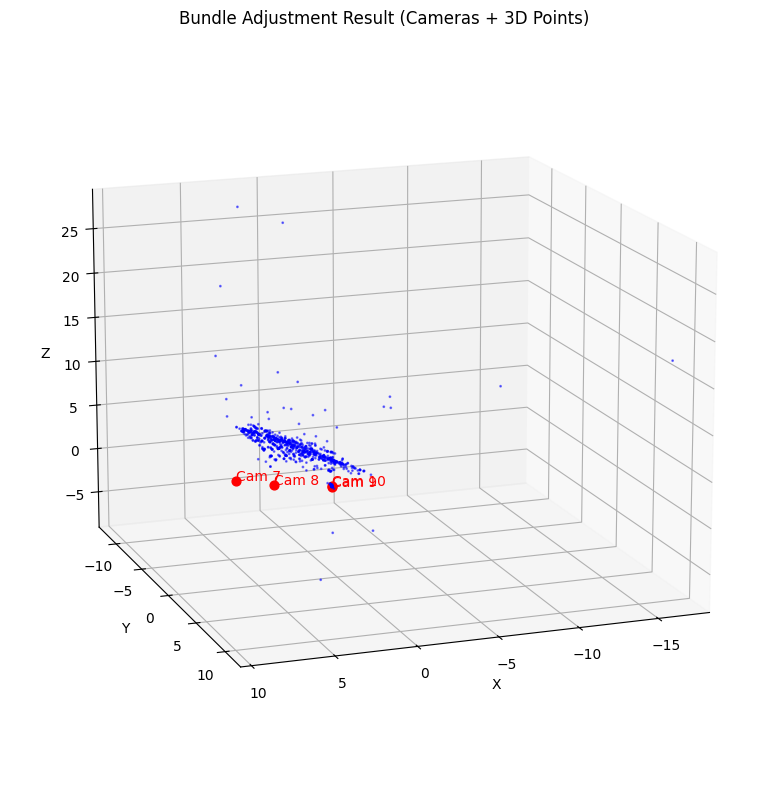

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_reconstruction(camera_poses, points_3d):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    ax.set_title("Bundle Adjustment Result (Cameras + 3D Points)")

    # Convert list of points to array
    pts = np.array(points_3d)

    # Plot 3D points 
    ax.scatter(pts[:,0], pts[:,1], pts[:,2], s=1, c="blue", alpha=0.5)

    # Plot cameras
    for cam_id, (R, t) in camera_poses.items():
        C = -R.T @ t   # camera center in world coords
        C = C.reshape(3)

        # Plot camera center
        ax.scatter(C[0], C[1], C[2], c="red", s=40)

        # Plot camera orientation
        z_dir = R.T @ np.array([0, 0, 1]) * 0.2
        ax.plot(
            [C[0], C[0] + z_dir[0]],
            [C[1], C[1] + z_dir[1]],
            [C[2], C[2] + z_dir[2]],
            color="red"
        )

        ax.text(C[0], C[1], C[2], f"Cam {cam_id}", color="red")

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.view_init(elev=15, azim=70)
    plt.tight_layout()
    plt.show()

plot_reconstruction(camera_poses, points_3d)